# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>PABLO RAMBLADO CARRASCO</mark>



<font color='#ADD8E6'>En esta práctica aprenderás:

<font color='#ADD8E6'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='#ADD8E6'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='#ADD8E6'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [6]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2
import math

Mounted at /content/drive
/content/drive/My Drive


In [7]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [8]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [9]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [10]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

Aqui incluimos el código de la P1 para calcular la función Gaussiana y sus dos primeras derivadas.

In [11]:
def GaussFunc(x,sigma):
    return pow(math.e, -(x**2)/(2*sigma**2))

def GaussDeriv1Func(x,sigma):
    return (-x/sigma**2) * GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    return (x**2/sigma**4 - 1/sigma**2) * GaussFunc(x,sigma)

# Si "get_all" = "false", devuelve solo la máscara en otro caso los valores necesarios
def gaussianMask1D(sigma=0, sizeMask=0, order=0, get_all=False):
    # Asignaciones mínimas si ambos son no válidos
    if sizeMask <= 0 and sigma <= 0:
      sigma = 1.0
      sizeMask = 7

    elif sigma <= 0: # Calcular correctamente sigma
      if sizeMask % 2 == 0: sizeMask -= 1
      sigma = round((sizeMask - 1) / 6, 3)

    elif sizeMask != (temp := 6 * sigma + 1) or sizeMask == 0: # Calcular la máscara correctamente
      sizeMask = int(temp)
      if sizeMask % 2 == 0: sizeMask -= 1

    # Capturamos el rango de valores enteros
    K = (sizeMask - 1) // 2
    x_vals = np.linspace(-K, K, num=sizeMask, dtype=int)
    #print(f"T={sizeMask}\nσ={sigma}\nk={K}\nPositions={x_vals}")

    # Segun el orden se crea una mascara u otra y se normaliza
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana
    if order == 0:
        mask = np.array([GaussFunc(x, sigma) for x in x_vals])
        mask /= np.sum(mask)

    elif order == 1:
        mask = np.array([GaussDeriv1Func(x, sigma) for x in x_vals])
        mask *= sigma

    elif order == 2:
        mask = np.array([GaussDeriv2Func(x, sigma) for x in x_vals])
        mask *= sigma**2

    else:
        print("'Order' tiene que ser 0, 1 o 2")

    return (x_vals, mask, sigma, sizeMask) if get_all else mask

Hacemos lo mismo para la convolución 2D, que hemos hecho de forma manual sin incluir ninguna funciones como `cv2.getDerivKernels()`, `cv2.GaussianBlur()`, `cv2.filter2D()` y similares. Simplemente copiamos el código de la P1, con cambios menores para ajustarse a los parametros de entrada `im`,`sigma` y `orders`.

In [12]:
def convolve1D(image, kernel):
    kernel_2d = np.repeat(kernel[:, np.newaxis], image.shape[1], axis=1)
    padding = len(kernel) // 2

    # Convolución por columnas
    output = np.zeros_like(image)
    for i in range(padding, image.shape[0] - padding):
        # Extraer la ventana que corresponde a la fila "i" y las filas adyacentes
        ventana = image[i - padding : i + padding + 1, :]
        output[i, :] = np.sum(kernel_2d * ventana, axis=0)

    return output

def my2DConv(im, sigma, orders):
    if len(orders) != 2:
        raise ValueError("Orders debe tener dos valores, uno para cada eje (x, y).")

    # Generar kernels 1D usando gaussianMask1D
    kx = gaussianMask1D(sigma=sigma, order=orders[0])
    ky = gaussianMask1D(sigma=sigma, order=orders[1])

     # Validar que los kernels tengan longitud impar
    if (len(kx) % 2 == 0) or (len(ky) % 2 == 0):
      raise ValueError("Los kernels generados deben tener longitud impar.")

    # Añadir padding a la imagen
    padding_x = len(kx) // 2
    padding_y = len(ky) // 2
    padded_im = np.pad(im, ((padding_y, padding_y), (padding_x, padding_x)), mode='constant', constant_values=0)

    # Convolución separable usando los kernels
    convolved_x = convolve1D(padded_im, kx)
    convolved_y = convolve1D(convolved_x.T, ky).T

    # Retirar el padding y devolver la imagen resultante
    return convolved_y[padding_y:-padding_y, padding_x:-padding_x]

# <font color='#ADD8E6'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='#ADD8E6'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='#ADD8E6'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='#ADD8E6'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='#ADD8E6'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='#ADD8E6'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='#ADD8E6'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='#ADD8E6'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='#ADD8E6'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='#ADD8E6'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='#ADD8E6'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='#ADD8E6'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='#ADD8E6'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='#ADD8E6'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





### ***a) Fijar escalas de diferenciación (σD) e integración (σI).***

Fijamos las escalas de diferenciación  e integración, respectivamente $\sigma_{D} = 1.5$, determina el suavizado Gaussiano antes de calcular las derivadas y $\sigma_{I} = 2.25$ determina el suavizado posterior a ellas.

In [13]:
sigmaD=1.5
sigmaI=2.25

<br>

### ***b) Calcular las derivadas de la imagen.***

Para obtener las derivadas de la imagen, usamos la función `my2DConv`, que habíamos diseñado en la primera parte del ejercicio. En lugar de optar por las funciones estándar de OpenCV, como `cv2.getDerivKernels()`, `cv2.GaussianBlur()` o `cv2.filter2D()`, creamos manualmente las distintas convoluciones, como se pudo apreciar en la práctica 1.

La función `my2DConv` se ha adaptado un poco para recibir los nuevos parámetros necesarios, en este caso como se puede intuir incluyendo $\sigma_{D}$.

In [14]:
# Compute image derivatives
def derivatives(im,sigmaD):
  # Convertir la imagen a float32 para operaciones de punto flotante
  im = im.astype(np.float32)

  dx = my2DConv(im, sigmaD, [1, 0])
  dy = my2DConv(im, sigmaD, [0, 1])

  return dx,dy

<br>

### ***c) Calcular los tres términos de la Second Moment Matrix ( SMM )***

La Matriz de Segundo Momento (Second Moment Matrix, SMM) es una matriz *2x2* que analiza los gradientes de intensidad de una imagen en un vecindario local, siendo clave para detectar esquinas y bordes en el detector de Harris. Se construye a partir de las derivadas de la imagen  $I_x$ (en la dirección $x$) y$I_y$ (en la dirección $y$), combinadas mediante un suavizado gaussiano $w(x, y)$. Esta matriz representa las diferencias de intensidad en una ventana alrededor de cada píxel, capturando tanto las intensidades de los gradientes en cada dirección como la interacción entre ellos, lo que permite identificar características relevantes de la imagen. Su formula es la siguiente:

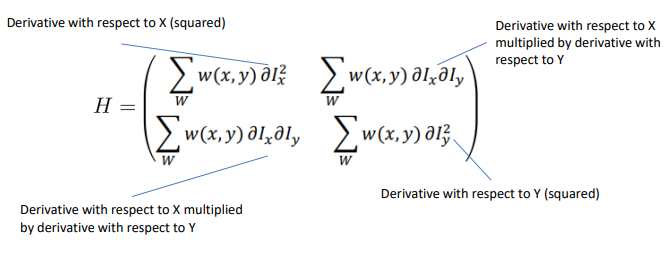

- $\sum_{W} w(x, y) \partial I_x^2$ : Intensidad del gradiente en $x$, suavizada con una ventana gaussiana $w(x,y)$. Mide cómo cambian los valores de la imagen en esa dirección.

- $\sum_{W} w(x, y) \partial I_y^2$ : Intensidad del gradiente en $y$, tambien suavizada. Indicando las variaciones en la intensidad de los píxeles en la dirección vertical de la imagen.


- $\sum_{W} w(x, y) \partial I_x I_y$ : Interacción entre los gradientes en $x$ e $y$, suavizado. Captura la correlación cruzada entre los cambios en ambas direcciones.


Cada uno de estos valores se almacena para cada píxel en la imagen. Es decir, cada uno tendrá tres valores asociados: $I_x^2$,  $I_y^2$ y  $I_x I_y$ . Esto es debido a que aunque la matriz es de tamaño *2x2*, el término $\sum_{W} w(x, y) I_x I_y$ aparece dos veces: una en la posición superior derecha y otra en la inferior izquierda. Esto hace que solo sea necesario almacenar ese valor una sola vez. Además en este caso usamos $\sigma_{I}$.



<br>

### ***d) Mapa de Harris***

El mapa de Harris se obtiene calculando el determinante y la traza de la matriz de Harris $H$ para cada píxel de la imagen. Estos permiten evaluar la probabilidad de que un píxel sea una esquina. Un determinante alto y una traza pequeña indican que el píxel tiene una fuerte variación en ambas direcciones (esquina). El resultado es un mapa de valores que refleja la intensidad de las esquinas en la imagen. Podemos calcularlo de la siguiente manera:

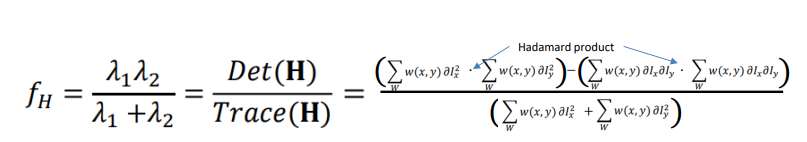

In [15]:
# Compute Harris-criterium Map
def HarrisMap(dx,dy,sigmaI):
  # Calcular los trés terminos de la Smm
  I_x = my2DConv(dx**2,sigmaI, orders=(0,0))
  I_y = my2DConv(dy**2,sigmaI, orders=(0,0))
  I_xy = my2DConv(dx*dy,sigmaI, orders=(0,0))

  det_H = (I_x * I_y) - I_xy**2  # Determinante
  trace_H = I_x + I_y            # Traza
  HMap = det_H / trace_H         # Mapa de Harris

  return HMap

<br>

### ***e) Supresión de no máximos***

La supresión de no máximos (Non-Maxima Suppression) se utiliza para eliminar las respuestas débiles (valores bajos en el mapa de Harris) y redundantes en la detección de esquinas, asegurando que solo se mantengan las más fuertes (valores altos) y separadas. En el caso del algoritmo de Harris, la función `corner_peaks()` de `scikit-image` se encarga de esto. Utilizando los parámetros `min_distance` y `threshold_abs`, podemos controlar la distancia mínima entre las esquinas detectadas y el valor mínimo necesario para que un píxel sea considerado como una esquina.  

El parámetro `min_distance` asegura que las esquinas estén suficientemente separadas, mientras que `threshold_abs` elimina las respuestas débiles. El resultado es una lista de coordenadas \((x, y)\) de las esquinas más significativas, y al extraer los valores en esas coordenadas, obtenemos una lista de vectores \((x, y, value)\).

In [16]:
def NonMaximaSuppression(harrisMap, min_distance, threshold):
  # Detectar las esquinasos picos (esquinas) en el mapa de Harris utilizando corner_peaks
  corners = corner_peaks(harrisMap, min_distance=min_distance, threshold_abs=threshold)

  # Valores de las esquinas
  values = []
  for corner in corners:
    x, y = corner
    values.append(harrisMap[x, y])

  # Coordenadas de las esquinas y sus valores
  return corners, values

<br>

### ***f) Orientación principal***

Para calcular la orientación principal de cada punto detectado en la imagen, primero se suavizan las imágenes derivadas en las direcciones $x$ e $y$. Aplicaremos un filtro de suavizado con un valor de $𝜎 = 3$. Y una vez suavizadas las derivadas, se calcula la orientación del gradiente en cada punto utilizando la fórmula:

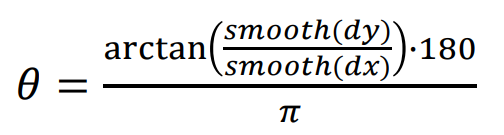

La función $arctan$ calcula el ángulo del gradiente en radianes para cada punto,es por ello que luego, multiplicamos por $\frac{180}{\pi}$ para convertirlo a grados. Así, obtenemos la dirección del cambio más fuerte en la intensidad en ese lugar.

Hay que tener en cuenta que, `theta` es una matriz 2D que almacena los ángulos de orientación del gradiente en cada píxel de la imagen, donde cada valor en la posición `(y, x)` corresponde a la orientación del gradiente en ese punto específico.

In [17]:
# compute the orientation map
def orientation(dx,dy):
  # Derivada en ambas direcciones
  smooth_dx = my2DConv(dx, sigma=3.0, orders=(0,0))
  smooth_dy = my2DConv(dy, sigma=3.0, orders=(0,0))

  # Orientacion en ángulos del gradiente
  angle = np.arctan2(smooth_dy, smooth_dx)
  theta = (angle * 180) / np.pi

  return theta

<br>

### ***g) Lista de KeyPoints.***

Antes de crear la lista de KeyPoints, hay que tener en cuenta que este es un vector que contiene las coordenadas (x, y) de un punto, junto con información como la escala y la orientación del gradiente en ese punto. Con estos puntos de interés detectados (esquinas), se pueden crear objetos KeyPoint que encapsulan esta información y permiten visualizarlos o procesarlos en etapas posteriores, como el emparejamiento de características. Para ello utilizaremos la función `cv2.KeyPoint()` de OpenCV.

Un ejemplo de ellos, son los puntos rojos que se pueden visualizar en la imagne de abajo. Como podemos observar, captura gran parte de los puntos que considera esquinas.

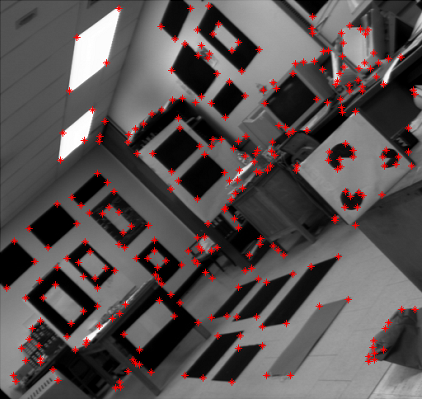

Por lo que tomamos una lista de coordenadas (x, y) y, para cada una de ellas, obtenemos la orientación correspondiente desde el mapa `theta` (que contiene los ángulos del gradiente). Luego, creamos un objeto `cv2.KeyPoint` utilizando la posición `(y, x)` (invertida al formato esperado por OpenCV), un tamaño `size` y la orientación obtenida `angle`. Finalmente, cada `KeyPoint` creado se agrega a la lista.

In [18]:
# Create the KeyPoint list from the lists of locations, orientations and scales
def keyPoints(coord,theta,size):
  keyPoints=[]

  for (x, y) in coord:
    angle = theta[x, y] # Obtener la orientación desde theta
    keyPoint = cv2.KeyPoint(x=float(y), y=float(x), size=float(size), angle=angle)  # Usar los nombres correctos
    keyPoints.append(keyPoint)  # Añadir el KeyPoint a la lista

  return(keyPoints)

<br>

### ***h) Dibujar los KeyPoints sobre una imagen.***

Primero, visualizamos el mapa de Harris. Para ello, es necesario convertir la imagen a escala de grises, ya que el mapa de Harris se basa en las derivadas de la intensidad de la imagen. Si trabajamos con una imagen en color, primero debemos convertirla a escala de grises utilizando `cv2.cvtColor()`.

(1200, 1600)


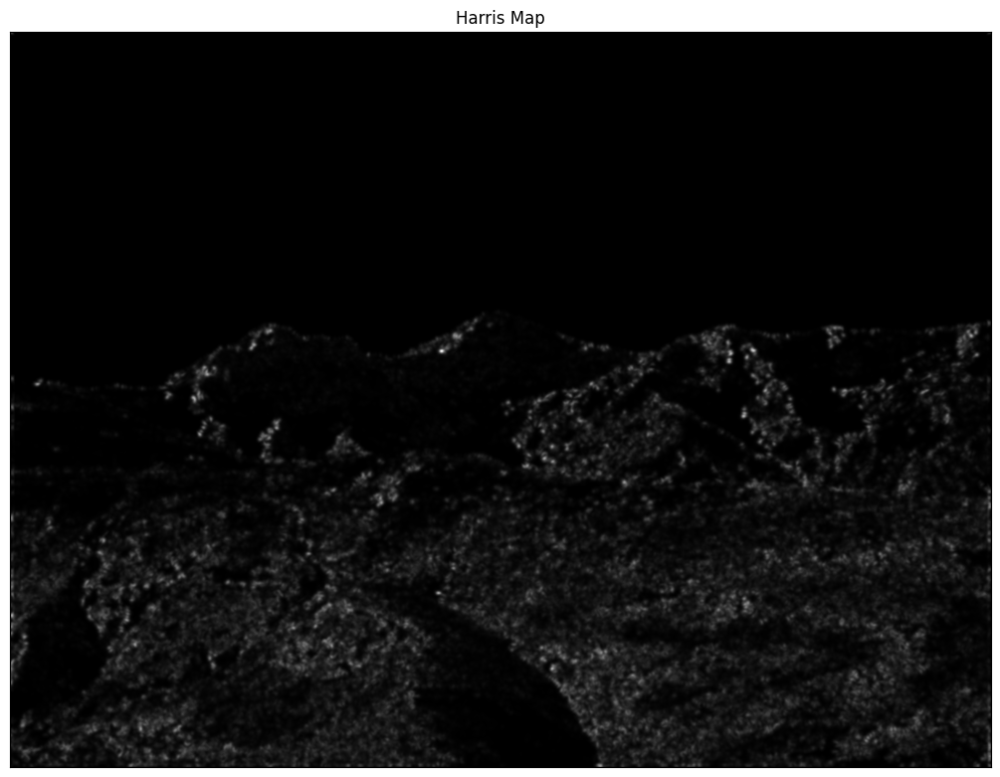

In [19]:
from skimage.feature import corner_peaks

# Leer la imagen y convertir a escala de grises
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
im = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
print(im.shape)

# Calcular las derivadas
dx, dy = derivatives(im, sigmaD)

# Calcular el mapa de Harris
harrisMap = HarrisMap(dx, dy, sigmaI)

# Visualizarlo
displayIm(harrisMap,'Harris Map', 2)

Ahora vamos a obtener el **Harris Map Thresholded**. Para ellos, aplicamos un umbral al mapa de Harris previamente calculado. Este mapaes el resultado de filtrar los valores del mapa de Harris, consiguiendo solo aquellos píxeles cuya respuesta es mayor que un valor umbral determinado. Gracias a este identificamos las esquinas más relevantes y eliminamos las zonas con respuestas débiles o irrelevantes.

Al aumentar el valor de `min_distance` y `threshold`, la detección de esquinas se vuelve más selectiva, reduciendo la cantidad de puntos de interés detectados, enfocándose en los más fuertes y dispersos.

Usaremos `cv2.threshold` para aplicar un umbral a la matriz `harrisMap2`, estableciendo en 0 (`cv2.THRESH_TOZERO`) todos los valores menores que el umbral especificado (en este caso, `threshold`). Los valores que son mayores o iguales al umbral se mantienen sin cambios. Aunque no se modifican los valores mayores al umbral, es necesario asignar un valor máximo (en este caso, 255) al tercer parámetro de la función, ya que la función lo requiere.

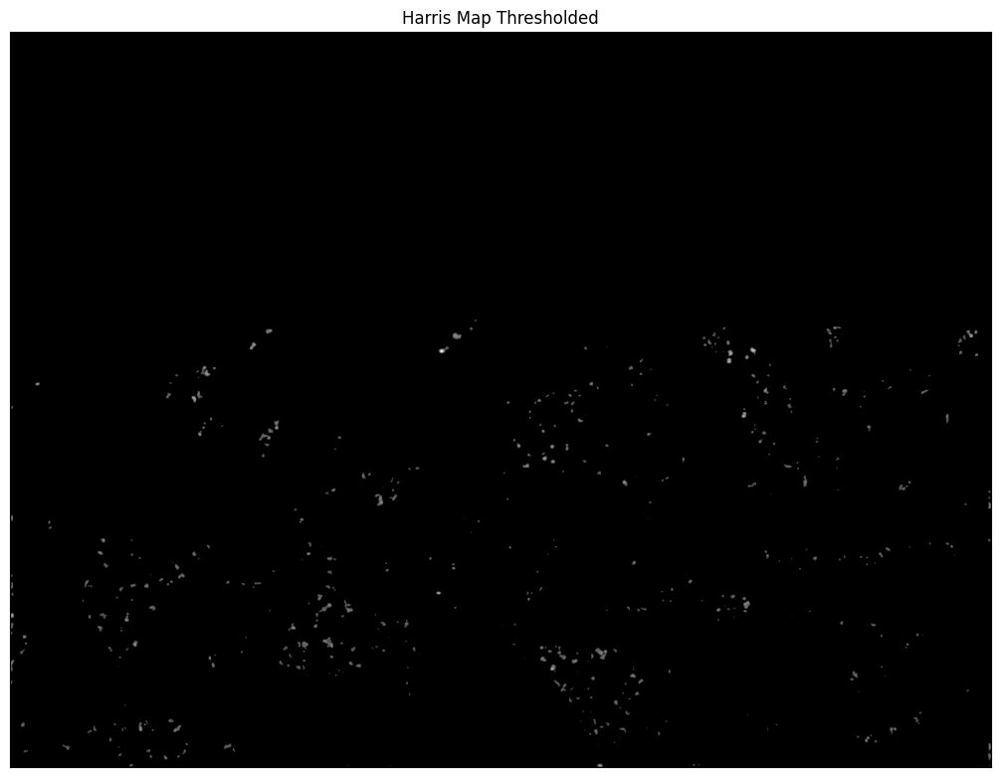

In [20]:
# Aplicar NonMaximaSuppression
min_distance = 10  # Distancia mínima entre picos
threshold = 1500  # Umbral
corners, values = NonMaximaSuppression(harrisMap, min_distance, threshold)

harrisMap2 = harrisMap.copy()
_, harrisMap2 = cv2.threshold(harrisMap2, threshold, 255, cv2.THRESH_TOZERO)

displayIm(harrisMap2,'Harris Map Thresholded',2)

Usamos el size recomendado en el enunciado `size=4*np.floor(3*sigmaI)+1`.

Luego, la función `cv2.drawKeypoints()` tiene los siguientes valores:

- *img* : La imagen sobre la que se dibujará los puntos

- *keyPoints* : La lista de los keyPoints.

- *None*: Imagen de salida donde se dibujará los puntos claves.

- *color=(255,0,0) : Color de los puntos dibujados rojo en este caso.

- *flags* : Los distintos flags que se usarán.

Se han detectado 321 KeyPoints


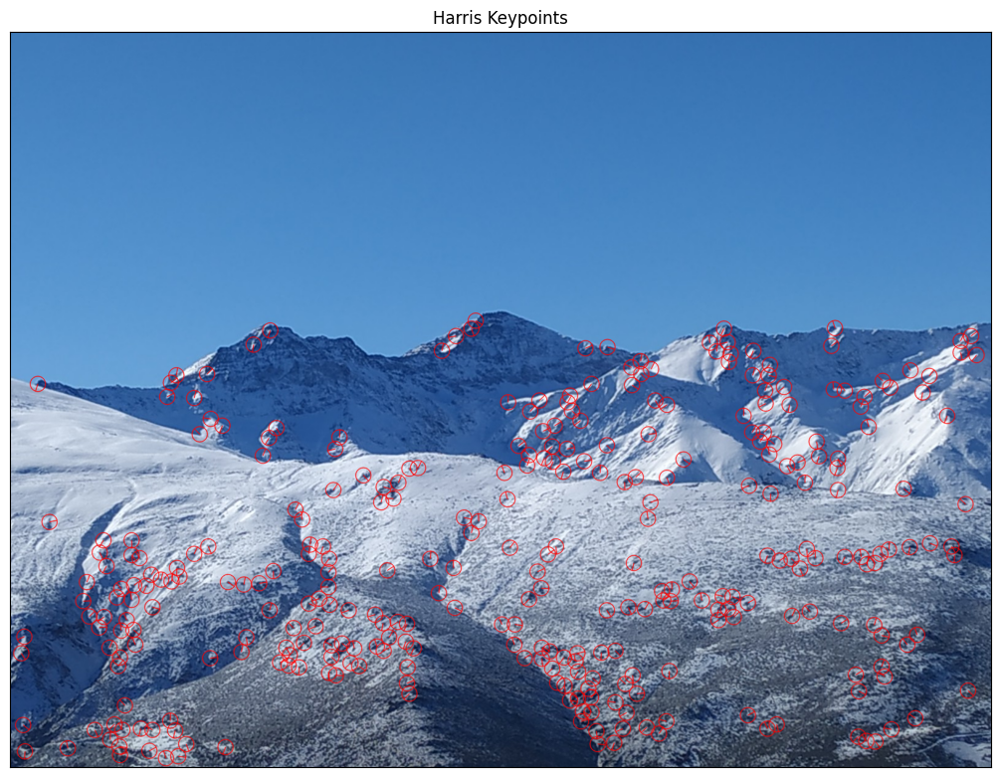

In [21]:
theta = orientation(dx, dy)

size=4*np.floor(3*sigmaI)+1
keyPoints=keyPoints(corners,theta,size)

harrisKeypoints = cv2.drawKeypoints(img, keyPoints, None, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

print(f"Se han detectado {len(keyPoints)} KeyPoints")
displayIm(harrisKeypoints,'Harris Keypoints',2)

# <font color='#ADD8E6'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='#ADD8E6'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='#ADD8E6'>SIFT (Scale-invariant feature transform)

<font color='#ADD8E6'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='#ADD8E6'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

Como ya vimos en teoría, **SIFT** (Scale-Invariant Feature Transform) es un algoritmo que detecta puntos característicos en una imagen y los describe mediante un histograma orientado de gradientes. Su principal ventaja es su invarianza a cambios de escala, orientación y posición, lo que lo hace robusto para análisis en condiciones variables. Cada punto queda representado por un vector de 128 características, junto con su posición, escala y orientación dominante.

Los features en SIFT se obtienen combinando los keypoints, con sus correspondientes descriptores.


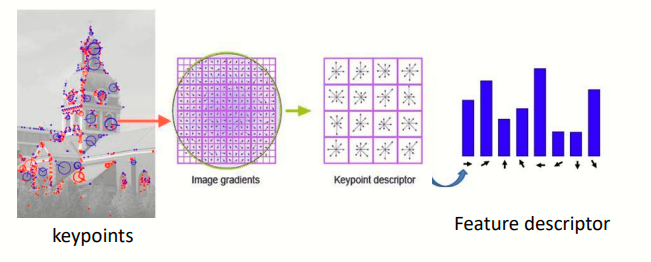

Por ello, usaremos OpenCV para detectar y calcular características SIFT en una imagen. Lo primero será crear un objeto SIFT configurado con un número máximo de características (`nfeatures`) ya dados y luego usar su método `detectAndCompute` para extraer los puntos clave (`keypoints`) y los descriptores asociados. Estos puntos representan las posiciones de interés en la imagen, mientras que los descriptores son vectores que describen el contenido visual en esas regiones.

In [22]:
def siftPoints(im, nfeatures=5000):
  # Crear el objeto SIFT
  sift = cv2.SIFT_create(nfeatures=nfeatures)

  # Encontrar los keypoints y descriptores SIFT en la imagen
  kp, ds = sift.detectAndCompute(im, None)

  return kp, ds

En OpenCV, cuando se realiza un emparejamiento de puntos clave entre imágenes, el resultado es un vector de registros que contiene información sobre los índices de los puntos clave emparejados y la distancia entre ellos. Antes de llegar a este paso, es importante analizar los puntos clave detectados en una imagen, para lo cual es necesario representarlos gráficamente.

Para visualizar los puntos clave detectados en una imagen, empleamos la ya utilizada función `cv2.drawKeypoints`, que permite dibujar estos puntos sobre la imagen original. Donde la función `showKP`, tiene como propósito dibujar los puntos clave detectados en una imagen y mostrar el resultado.

Luego, con `showMatches` visualizamos los puntos emparejados entre dos imágenes, dibujando líneas que conectan los puntos correspondientes en ambas imágenes. Esta recibe las dos imágenes (`im1` y `im2`), junto con sus keypoints (`kp1` y `kp2`), y una lista de `matches` que indica las correspondencias entre los puntos clave de las imágenes. Además, se le pasa un número `N` que determina cuántos de estos matches se deben mostrar.

Utilizaremos dentro de esta función `cv2.drawMatches` para dibujar los primeros  `N` matches. Los parámetros que se le pasan son: las imágenes y sus respectivos keypoints, la lista de los *N* matches y un valor `None` para la salida, que crea una nueva imagen con los matches dibujados. Y finalmente el flag `cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS`, que asegura que solo se dibujen las líneas entre los puntos emparejados, sin marcarlos individuales.


In [32]:
# This function display the KeyPoints of an image
def showKP(im,kp,title):
  im=cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  displayIm(im,title,1)

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  imBF = cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  # Display the resulting image
  displayIm(imBF, title, 2)

Para emparejar los puntos clave entre dos imágenes, se emplean tres criterios de emparejamiento:  **Brute Force**, **Brute Force con cross-check**, y **Lowe's ratio test**.


El primero, **Brute Force (`cv.BFMatcher`)**, simplemente calcula la distancia entre el descriptor de una característica de un conjunto y todos los descriptores del otro conjunto. Luego, devuelve el más cercano. Estos métodos generalmente se utilizan con el tipo de distancia `cv.NORM_L2`, adecuado para descriptores como los de **SIFT** o **SURF**. En este caso, el BFMatcher compara cada descriptor de la primera imagen con todos los descriptores de la segunda imagen y elige el más cercano.

El segundo criterio es **Brute Force con cross-check (`cv.BFMatcher` con ``crossCheck=True`)**. Al activar **crossCheck**, el matcher solo devuelve un emparejamiento válido si ambos puntos coinciden mutuamente: es decir, si el descriptor de la primera imagen es el mejor para el de la segunda imagen y viceversa. De esta forma se mejora la precisión y la consistencia, ya que filtra emparejamientos incorrectos, eliminando correspondencias ambiguas y ofreciendo una mayor fiabilidad, aunque con un costo computacional mayor.

<img src="https://docs.opencv.org/4.x/matcher_result2.jpg" width=550>
<img src="https://docs.opencv.org/4.x/matcher_flann.jpg" width=550>

El tercer criterio, **Lowe's ratio test (`cv.BFMatcher` con `knnMatch()`)**, se utiliza para hacer un análisis más preciso y reducir el número de falsos positivos. Este método encuentra los **k** mejores emparejamientos para cada descriptor y calcula la relación entre la distancia del mejor y el segundo mejor emparejamiento. Si la distancia del primer emparejamiento es mucho menor que la del segundo (por ejemplo, con un umbral por defecto de 0.75), se considera que el emparejamiento es válido. El uso de `cv.BFMatcher().knnMatch()` con **k=2** permite aplicar el test de relación de *Lowe*, ayudando a seleccionar solo los emparejamientos más fiables. Usamos este valor de *K* porque permite comparar la distancia del mejor emparejamiento con la del segundo mejor. Si usasemos más vecinos (como **k=3**) podría introducir emparejamientos incorrectos y sería menos eficiente.

Por ejemplo teniendo estas dos imágenes:

<img src="https://media.geeksforgeeks.org/wp-content/uploads/20221114223621/IMG202211142227551.jpg">

<br>

<img src="https://media.geeksforgeeks.org/wp-content/uploads/20221114223621/IMG202211142228021.jpg">


El resultado sería el siguiente:

<img src="https://media.geeksforgeeks.org/wp-content/uploads/20221114230857/Screenshot20221114230618.jpg">


In [24]:
#This function compute matches between descriptors of two images
def matching(ds1,ds2,FlagMode='BF+CC'):
  crossCheck = True if FlagMode == 'BF+CC' else False
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)

  if FlagMode == 'BF' or FlagMode == 'BF+CC':
    bf = bf.match(ds1, ds2)
    # Ordenar los emparejamientos para tener los mejores al principio
    matches = sorted(bf, key=lambda x: x.distance)
    return matches

  elif FlagMode=='KNN':
    knn_matches = bf.knnMatch(ds1, ds2, k=2) # Buscar los k mejores matches (k=2 en este caso)
    # Filtrar para obtener solo los mejores emparejamientos y ordenarlos
    good = [m for m,n in knn_matches if m.distance < 0.75 * n.distance]
    good = sorted(good, key=lambda x: x.distance)
    return good

  else:
    return print('Error in Matching mode')

Declaramos el numero de matches y leemos las 2 primeras imágenes.

In [25]:
numberOfmatches = 100

In [26]:
img1=cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

Ahora, vamos a dibujar los keypoints encontrados en cada imagen.

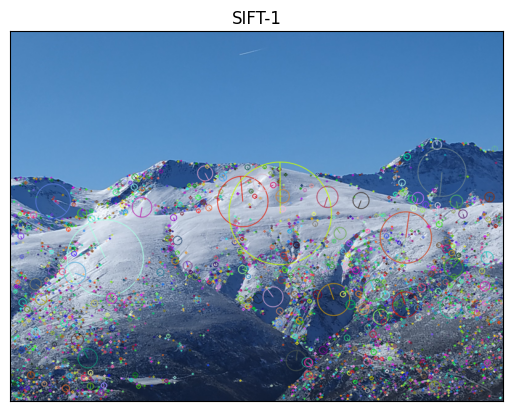

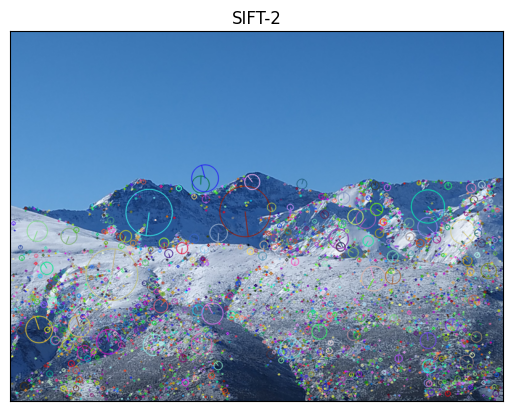

In [33]:
# Detectar keypoints y descriptores de ambas imágenes
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Mostrar los keypoints detectados en cada imagen
showKP(img1, kp1, 'SIFT-1')
showKP(img2, kp2, 'SIFT-2')

Ahora vamos a mostrar los matches en ambas imágenes, usando cada uno de los tres métodos.

<mark>COMENTAR RESULTADOS OBTENIDOS EN CADA UNO.

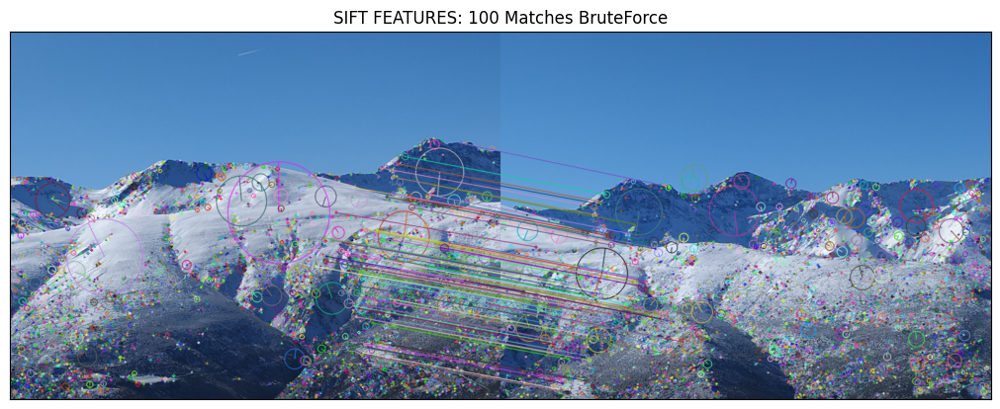

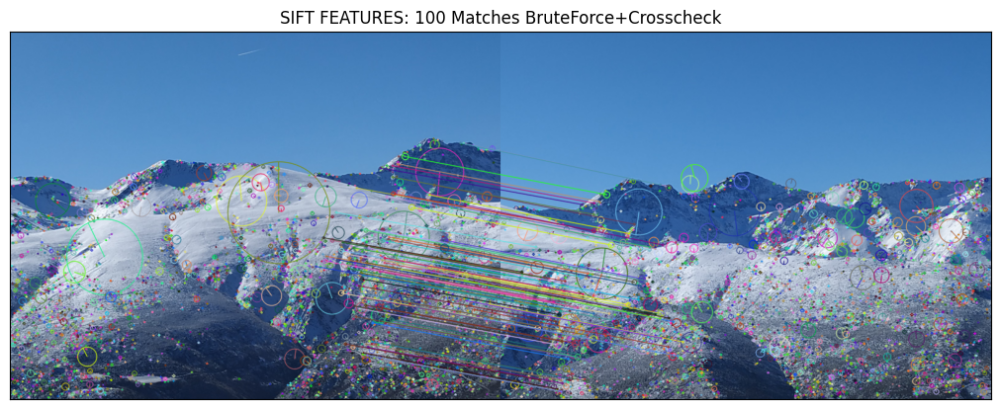

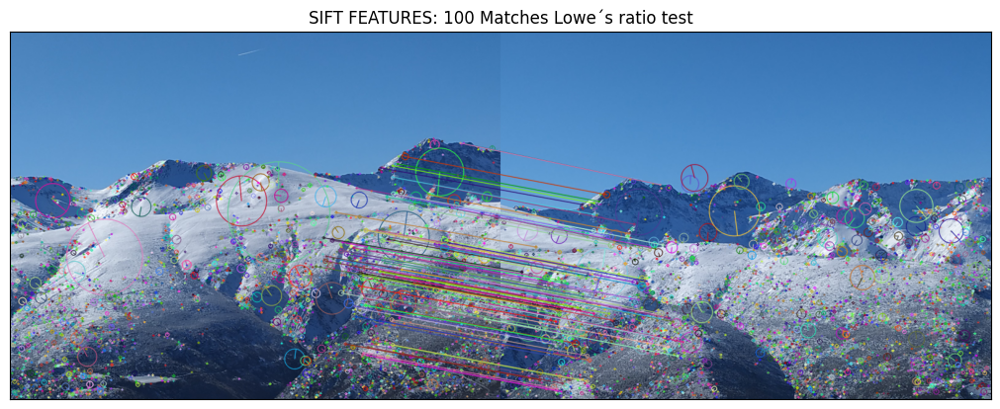

In [34]:
# Emparejar los descriptores
matches_BF = matching(ds1, ds2, FlagMode='BF')
matches_BF_CC = matching(ds1, ds2)
matchesKNN = matching(ds1, ds2, FlagMode='KNN')

# Mostrar los N primeros emparejamientos
N = 100
showMatches(img1, kp1, img2, kp2, matches_BF, N, title='SIFT FEATURES: 100 Matches BruteForce')
showMatches(img1, kp1, img2, kp2, matches_BF_CC, N, title='SIFT FEATURES: 100 Matches BruteForce+Crosscheck')
showMatches(img1, kp1, img2, kp2, matchesKNN, N, title='SIFT FEATURES: 100 Matches Lowe´s ratio test')

## <font color='#ADD8E6'>LBP (Local Binary Patterns)

<font color='#ADD8E6'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='#ADD8E6'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


In [ ]:
!pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 60.3 MB/s eta 0:00:00


In [ ]:
# A COMPLETAR POR EL ALUMNADO

## <font color='#ADD8E6'>HOG (Histogram of oriented gradients)

<font color='#ADD8E6'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

In [ ]:
from skimage.feature import hog
# A COMPLETAR POR EL ALUMNADO

<font color='#ADD8E6'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

# <font color='#ADD8E6'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='#ADD8E6'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

In [ ]:
# this function computes a homography
def homography(kp1,kp2,matches, Ransac_Error,MIN_MATCH_COUNT=20):

  if len(matches)>MIN_MATCH_COUNT:
    # A COMPLETAR POR EL ALUMNADO
  else:
     print('Error - very few matches')
  return H

<font color='#ADD8E6'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='#ADD8E6'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='#ADD8E6'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='#ADD8E6'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='#ADD8E6'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='#ADD8E6'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='#ADD8E6'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='#ADD8E6'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='#ADD8E6'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='#ADD8E6'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


In [ ]:
# this function computes the homographies between each two consecutive images
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0):
  # A COMPLETAR POR EL ALUMNADO
  return H

# this function computes the homography from each image to the canvas
# idx in this case is the index of the central image
def mosaicHomographies(H,idx):
  # A COMPLETAR POR EL ALUMNADO
  return H

# this function fixes the homography from the central image to the canvas
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H

In [ ]:
# Auxiliary functions

# this function defines and return the canvas
def setCanvas(row,col,flagColor,nim=2):
  # A COMPLETAR POR EL ALUMNADO

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


In [ ]:
# This function composes the mosaic. It receives:
# * images: the list of images
# * canvas: the canvas, generated through the application of setCanvas()
# * H: the list of homographies, obtained through the application of
# computeLocalHomographies() and mosaicHomographies()
# * idx: the index of the central image
# * H0: the homography that represents the translation from the central image to the
# canvas obtained through the application of axesHomography()
def composeMosaic(images,canvas,H,idx,H0):
  # A COMPLETAR POR EL ALUMNADO
  return canvas

<font color='#ADD8E6'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='#ADD8E6'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

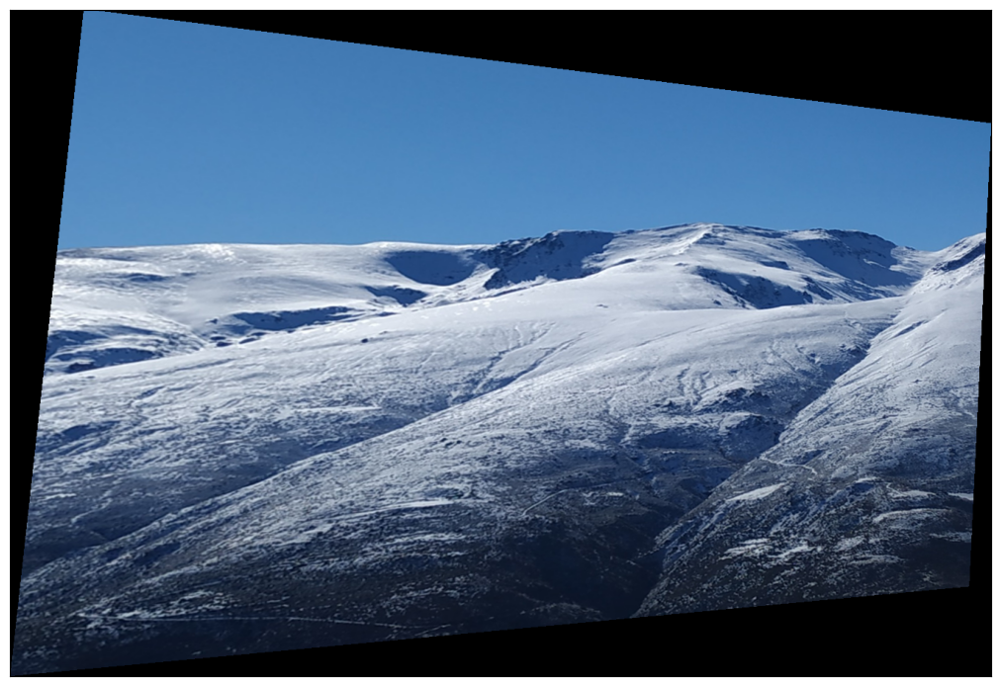

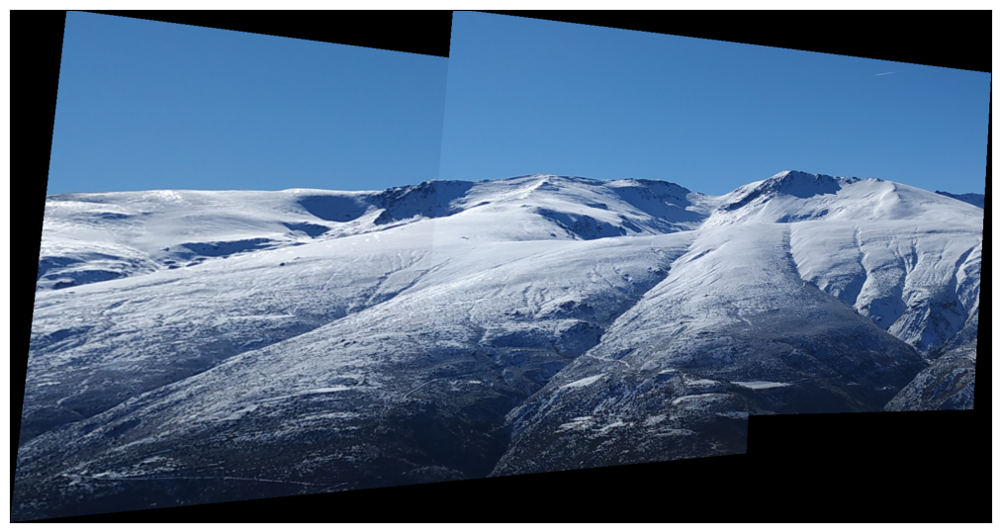

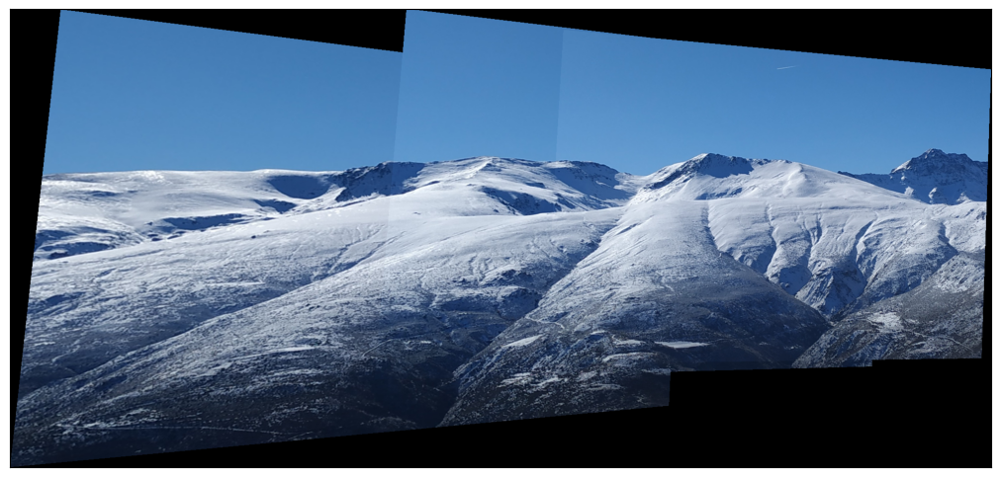

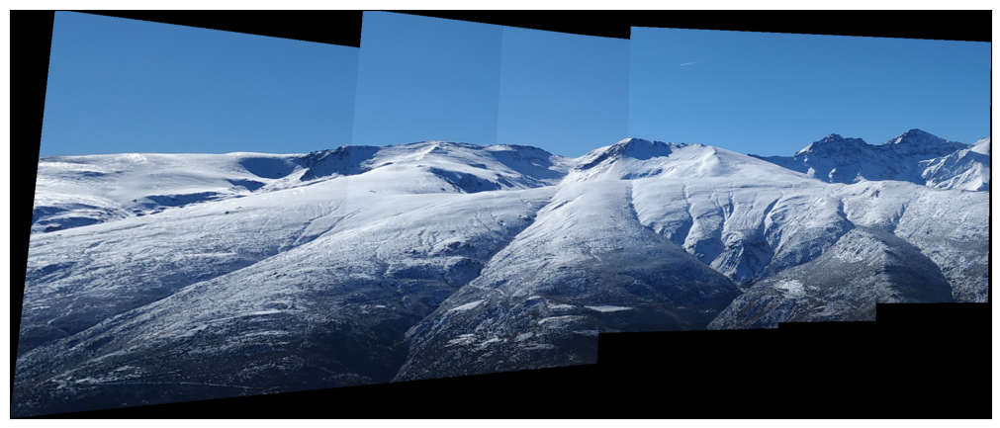

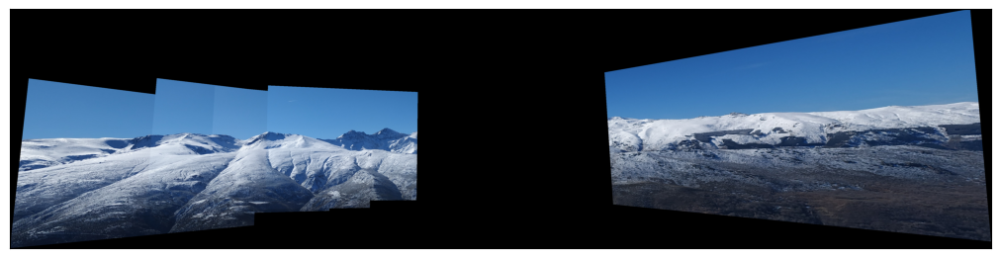

...

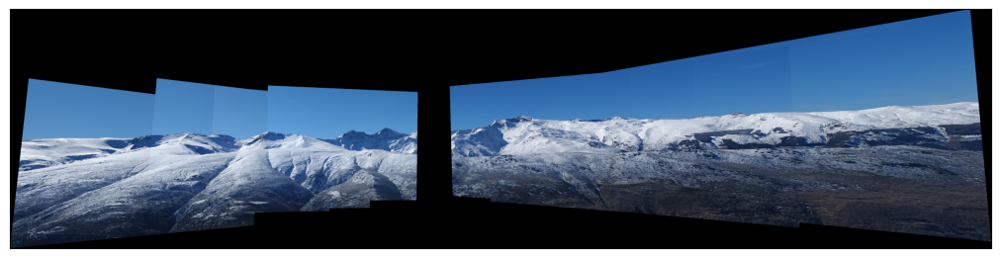

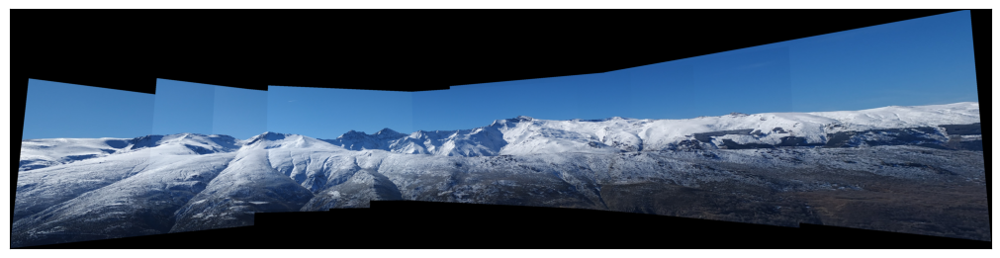

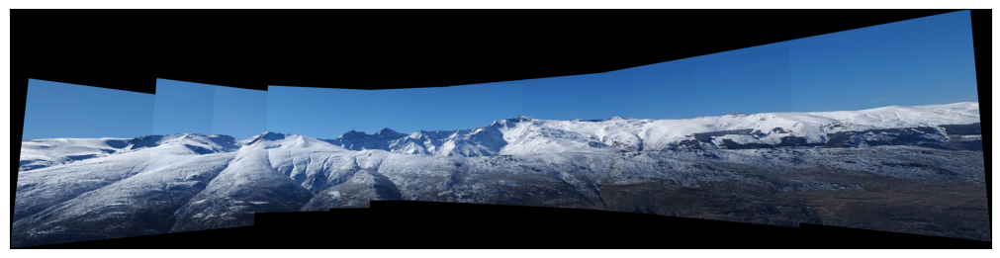

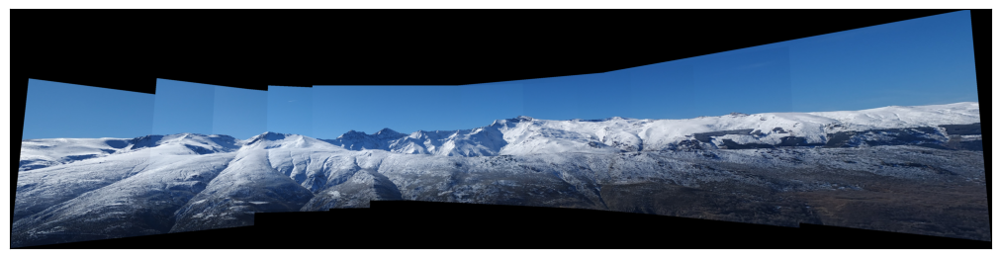

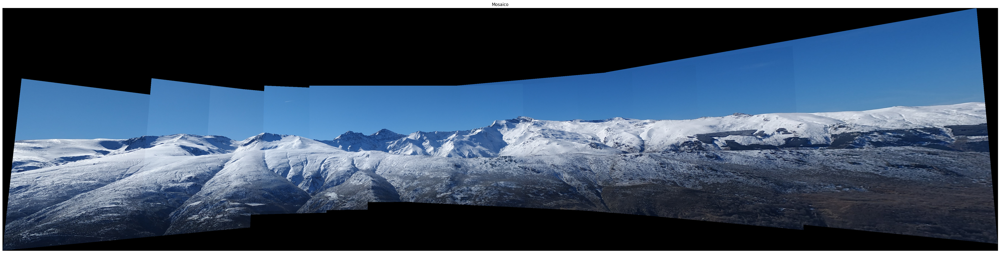

In [ ]:
PREFIX='IMG_20220312_1029'
nameImages=['34_S.jpg','37_S.jpg','40_S.jpg','42_S.jpg','44_S.jpg','46_S.jpg','48_S.jpg','50_S.jpg','51_S.jpg','54_S.jpg','57_S.jpg']

for item in nameImages:
   images.append(cv2.resize(readIm(get_image(PREFIX+item),flagColor=1), (0,0), fx=0.5, fy=0.5))

# A COMPLETAR POR EL ALUMNADO